[![Abrir en Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github//incubodac/GradCamTP/blob/main/DEPRECATED/GradCamTMP.ipynb)

### datos

In [1]:
!wget https://raw.githubusercontent.com/incubodac/GradCamTP/main/cat_dog.jpg -O cat_dog.jpg
!wget https://raw.githubusercontent.com/incubodac/GradCamTP/main/perro_gato_caballo.png

--2025-09-17 20:00:21--  https://raw.githubusercontent.com/incubodac/GradCamTP/main/cat_dog.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3529440 (3.4M) [image/jpeg]
Saving to: ‘cat_dog.jpg’

cat_dog.jpg         100%[===================>]   3.37M  --.-KB/s    in 0.04s   

2025-09-17 20:00:22 (94.6 MB/s) - ‘cat_dog.jpg’ saved [3529440/3529440]

--2025-09-17 20:00:22--  https://raw.githubusercontent.com/incubodac/GradCamTP/main/perro_gato_caballo.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1482363 (1.4M) [image/png]
Sa

### código

In [2]:
# %%capture
# Install required packages
import subprocess
import sys

packages = [
    "grad-cam",
    # "torch",
    # "torchvision",
    # "matplotlib",
    # "numpy",
    # "opencv-python",
    # "Pillow"
]

for package in packages:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", package])

print("All packages installed successfully!")

All packages installed successfully!


In [4]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import requests
import numpy as np
import matplotlib.pyplot as plt
from io import BytesIO

# Function to load images directly from URLs
def load_image_from_url(url, transform=None):
    """Load image directly from URL"""
    try:
        response = requests.get(url)
        image = Image.open(BytesIO(response.content)).convert('RGB')
        if transform:
            image = transform(image)
        return image
    except Exception as e:
        print(f"Error loading image from {url}: {e}")
        return None

# Define image preprocessing for ResNet
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()
    # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Test images from different categories - these are free stock images
test_images = {
    'cat': 'https://images.unsplash.com/photo-1514888286974-6c03e2ca1dba?w=400',
    'dog': 'https://images.unsplash.com/photo-1552053831-71594a27632d?w=400',
    'car': 'https://images.unsplash.com/photo-1494976388531-d1058494cdd8?w=400',
    'bird': 'https://images.unsplash.com/photo-1444464666168-49d633b86797?w=400',
    'chita': 'https://images.unsplash.com/photo-1551969014-7d2c4cddf0b6?w=400',
    'airplane': 'https://images.unsplash.com/photo-1436491865332-7a61a109cc05?w=400',
    'ship': 'https://images.unsplash.com/photo-1544551763-46a013bb70d5?w=400'
}

# Alternative: Use sample images from torchvision (if available)
def get_sample_images():
    """Get sample images for testing"""
    images = {}

    print("Loading test images...")
    for name, url in test_images.items():
        print(f"Loading {name}...")
        # Load original image for display
        try:
            response = requests.get(url)
            original_img = Image.open(BytesIO(response.content)).convert('RGB')
            # Load preprocessed image for model
            preprocessed_img = load_image_from_url(url, preprocess)

            if preprocessed_img is not None:
                images[name] = {
                    'original': original_img,
                    'tensor': preprocessed_img.unsqueeze(0),  # Add batch dimension
                    'url': url
                }
                print(f"✓ {name} loaded successfully")
            else:
                print(f"✗ Failed to load {name}")
        except Exception as e:
            print(f"✗ Error loading {name}: {e}")

    return images

# Load all test images
sample_images = get_sample_images()

print(f"Loaded {len(sample_images)} test images")


Loading test images...
Loading cat...
✓ cat loaded successfully
Loading dog...
✓ dog loaded successfully
Loading car...
✓ car loaded successfully
Loading bird...
✓ bird loaded successfully
Loading chita...
✓ chita loaded successfully
Loading airplane...
✓ airplane loaded successfully
Loading ship...
✓ ship loaded successfully
Loaded 7 test images


In [5]:
from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad,FinerCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet50, ResNet50_Weights, vgg19, VGG19_Weights, vit_l_16, ViT_L_16_Weights
import torch

import torchvision
from PIL import Image
import numpy as np

model = resnet50(pretrained=True)
target_layers = [model.layer4[-1]]
# open an image file
image = sample_images['cat']['original']
image = image.convert("RGB")
image = image.resize((224, 224))

# Convert PIL image to numpy array and normalize to [0, 1]
rgb_img = np.float32(image) / 255

input_tensor = torchvision.transforms.ToTensor()(image).unsqueeze(0)
# Note: input_tensor can be a batch tensor with several images!

# We have to specify the target we want to generate the CAM for.
targets = [ClassifierOutputTarget(246)]

# Construct the CAM object once, and then re-use it on many images.
with GradCAM(model=model, target_layers=target_layers) as cam:
  # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
  grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
  # In this example grayscale_cam has only one image in the batch:
  grayscale_cam = grayscale_cam[0, :]
  visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
  # You can also get the model outputs without having to redo inference
  model_outputs = cam.outputs

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:01<00:00, 82.2MB/s]


In [10]:
# Get ImageNet class labels
import requests
import torch.nn.functional as F

def get_imagenet_classes():
    try:
        url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
        response = requests.get(url)
        classes = response.text.strip().split('\n')
        return classes
    except:
        return [f"class_{i}" for i in range(1000)]

imagenet_classes = get_imagenet_classes()

# Define interesting classes to visualize
interesting_classes = [
    282,  # tiger cat
    285,  # Egyptian cat
    281,  # tabby cat
    404,  # airliner
    817,  # sports car
    130   # flamingo
]

# check if the classes names are correct
for idx in interesting_classes:
    print(f"{idx}: {imagenet_classes[idx]}")



282: tiger cat
285: Egyptian cat
281: tabby
404: airliner
817: sports car
130: flamingo


In [ ]:
[c for c in imagenet_classes if 'sea' in c]

['sea snake',
 'sea anemone',
 'sea slug',
 'sea lion',
 'sea urchin',
 'sea cucumber',
 'seat belt',
 'toilet seat',
 'seashore']

Creating improved 7x7 GradCAM visualization grid...
Classes used: ['tiger cat', 'Egyptian cat', 'tabby', 'airliner', 'sports car', 'flamingo']


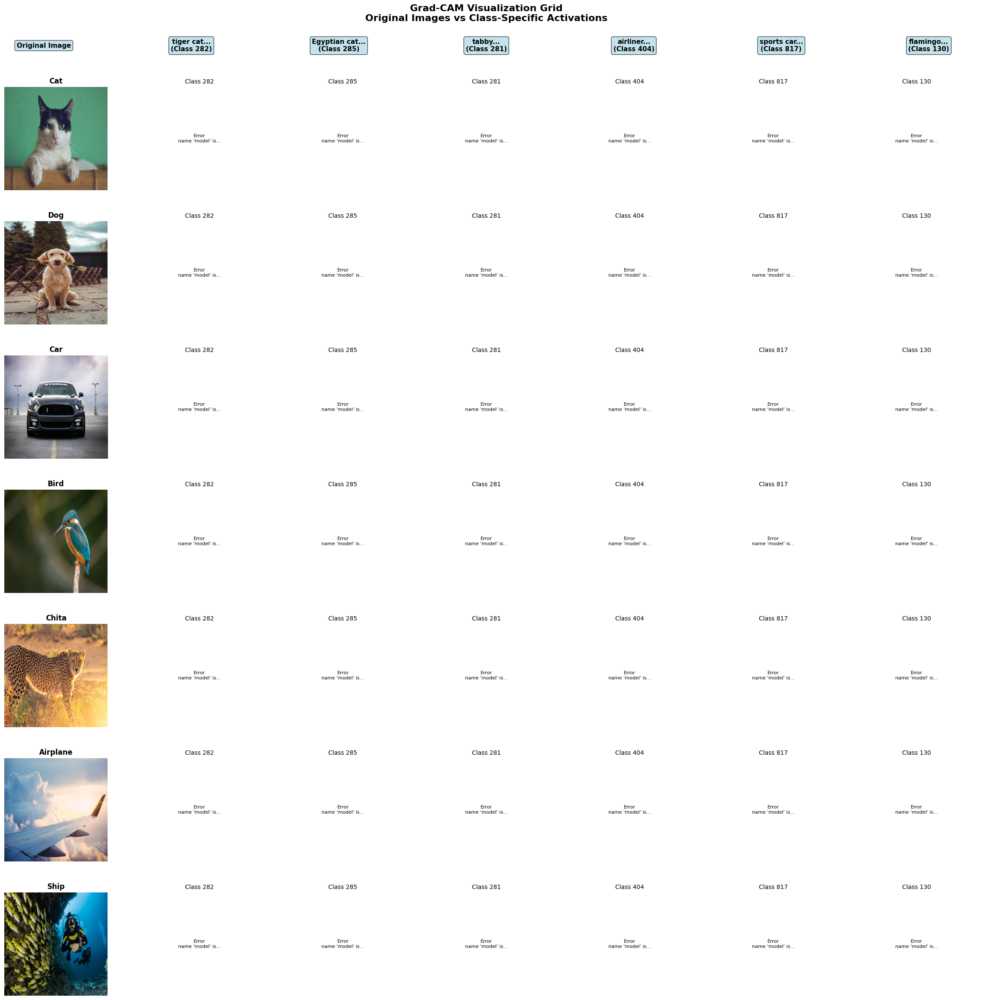

In [11]:
# Improved version with better layout
def create_improved_gradcam_grid(sample_images, interesting_classes):
    """Create a 7x7 grid with improved layout and spacing"""

    # Get first 7 images (or pad if less)
    image_names = list(sample_images.keys())[:7]

    # Create figure with better spacing
    fig, axes = plt.subplots(7, 7, figsize=(24, 24))

    # Set overall title
    fig.suptitle('Grad-CAM Visualization Grid\nOriginal Images vs Class-Specific Activations',
                 fontsize=16, fontweight='bold', y=0.98)

    for row, image_name in enumerate(image_names):
        if image_name not in sample_images:
            continue

        # Get image data
        image_data = sample_images[image_name]
        original_img = image_data['original']
        input_tensor = image_data['tensor']

        # Prepare original image for display
        display_img = original_img.resize((224, 224))
        rgb_img = np.float32(display_img) / 255

        # Column 0: Original image
        axes[row, 0].imshow(display_img)
        axes[row, 0].set_title(f'{image_name.capitalize()}', fontsize=12, fontweight='bold')
        axes[row, 0].axis('off')

        # Add a border around original images
        for spine in axes[row, 0].spines.values():
            spine.set_visible(True)
            spine.set_linewidth(2)
            spine.set_color('black')

        # Columns 1-6: GradCAM for different classes
        for col, class_idx in enumerate(interesting_classes[:6], 1):
            try:
                # Create GradCAM for this specific class
                targets = [ClassifierOutputTarget(class_idx)]

                with GradCAM(model=model, target_layers=target_layers) as cam:
                    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
                    grayscale_cam = grayscale_cam[0, :]

                    # Create overlay visualization
                    visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

                    # Get model output for this image
                    model_output = cam.outputs
                    probs = F.softmax(model_output, dim=1)
                    class_prob = probs[0, class_idx].item()

                axes[row, col].imshow(visualization)
                # Truncate long class names and add probability
                class_name = imagenet_classes[class_idx]
                if len(class_name) > 12:
                    class_name = class_name[:12] + "..."
                axes[row, col].set_title(f'{class_name}\n{class_prob:.3f}', fontsize=10)
                axes[row, col].axis('off')

            except Exception as e:
                # If there's an error, show a placeholder
                axes[row, col].text(0.5, 0.5, f'Error\n{str(e)[:15]}...',
                                  ha='center', va='center', transform=axes[row, col].transAxes,
                                  fontsize=8)
                axes[row, col].set_title(f'Class {class_idx}', fontsize=10)
                axes[row, col].axis('off')

    # Hide empty rows if we have fewer than 7 images
    for row in range(len(image_names), 7):
        for col in range(7):
            axes[row, col].axis('off')

    # Add detailed column headers with class names
    col_headers = ['Original Image'] + [f'{imagenet_classes[cls][:15]}...\n(Class {cls})'
                                       for cls in interesting_classes[:6]]

    # Position headers better
    for col, header in enumerate(col_headers):
        fig.text((col + 0.5)/7, 0.94, header, ha='center', va='center',
                fontsize=11, fontweight='bold',
                bbox=dict(boxstyle="round,pad=0.3", facecolor='lightblue', alpha=0.7))

    # Adjust layout with proper spacing
    plt.tight_layout(rect=[0, 0, 1, 0.92])  # Leave space for title and headers
    plt.subplots_adjust(
        top=0.90,      # Space for title and headers
        bottom=0.02,   # Small bottom margin
        left=0.02,     # Small left margin
        right=0.98,    # Small right margin
        hspace=0.3,    # Vertical spacing between rows
        wspace=0.1     # Horizontal spacing between columns
    )

    plt.show()

# Create the improved grid visualization
print("Creating improved 7x7 GradCAM visualization grid...")
print(f"Classes used: {[imagenet_classes[i] for i in interesting_classes[:6]]}")

create_improved_gradcam_grid(sample_images, interesting_classes)

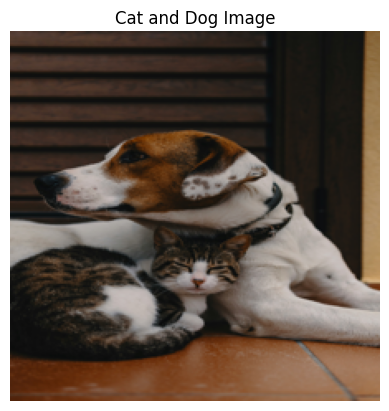

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

cat_dog_img = 'cat_dog.jpg'
cat_dog_img = Image.open(cat_dog_img).convert("RGB")
cat_dog_img = cat_dog_img.resize((224, 224))

plt.imshow(cat_dog_img)
plt.axis('off')  # Optional: hide axes for cleaner display
plt.title('Cat and Dog Image')  # Optional: add title
plt.show()

In [14]:
[(i, c) for i, c in  enumerate(imagenet_classes) if 'bus' in c]

[(138, 'bustard'),
 (375, 'colobus'),
 (654, 'minibus'),
 (779, 'school bus'),
 (874, 'trolleybus')]

In [24]:
[(i, c) for i, c in  enumerate(imagenet_classes) if 'plane' in c]

[(726, 'plane'), (727, 'planetarium'), (895, 'warplane')]

In [ ]:
clases_models = {
    'Tiger Cat': 282,
    'Golden Retriever': 207,
    'Street Car': 817,
    'School Bus': 779
}

target_classes = {
    'Tiger Cat': 282,
    # 'Tabby Cat': 281,
    # 'Egyptian Cat': 285,
    'Golden Retriever': 207,
    # 'Beagle': 162,
    # 'German Shepherd': 235
    'Zebra': 340,
    'Plane': 726,
    'Trailer Truck': 867
}

In [ ]:
imagenet_classes[867]

'trailer truck'

In [ ]:
import torch
import torchvision
from torchvision.models import resnet50, ResNet50_Weights
from PIL import Image
import numpy as np
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus, HiResCAM, AblationCAM, XGradCAM, EigenCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.guided_backprop import GuidedBackpropReLUModel
import gc

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Modelo
weights = ResNet50_Weights.DEFAULT
model = resnet50(weights=weights).to(device).eval()
target_layers = [model.layer4[-1]]

# Preprocesamiento: normalización ImageNet para el forward del modelo
preprocess = weights.transforms()  # = Resize(232)->CenterCrop(224)->ToTensor()->Normalize(mean,std)

# Cargar imagen y preparar dos copias: una normalizada para el modelo y otra [0,1] para overlay
img = Image.open('perro_gato_caballo.png').convert('RGB')
input_tensor = preprocess(img).unsqueeze(0).to(device)        # para el modelo
rgb_img = np.float32(np.array(img.resize((224, 224)))) / 255. # para show_cam_on_image, en [0,1]
rgb_img = rgb_img[:, :, ::-1][:, :, ::-1]  # no-op, solo deja en RGB si hiciste algún cambio antes

def create_guided_gradcam(model, input_tensor, target_class, target_layers):
    guided_model = GuidedBackpropReLUModel(model=model, device=device)
    guided_grads = guided_model(input_tensor, target_category=target_class)  # np.ndarray
    guided_grads = np.squeeze(guided_grads)  # (3,H,W) o (H,3,W) o (H,W,3)

    # Mover el eje de canales (el que vale 3) al final -> (H,W,3)
    if guided_grads.ndim == 3:
        axes = np.array(guided_grads.shape)
        if 3 in axes:
            c_axis = int(np.where(axes == 3)[0][0])
            guided_grads = np.moveaxis(guided_grads, c_axis, -1)
        else:
            raise RuntimeError(f'Forma inesperada: {guided_grads.shape}')
    elif guided_grads.ndim == 2:
        guided_grads = np.stack([guided_grads]*3, axis=-1)  # (H,W,3)
    else:
        raise RuntimeError(f'Forma inesperada: {guided_grads.shape}')

    # Grad-CAM
    with GradCAM(model=model, target_layers=target_layers) as cam:
        targets = [ClassifierOutputTarget(target_class)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]  # (H,W)

    # Multiplicación con broadcasting seguro
    guided_gradcam = guided_grads * grayscale_cam[..., None]

    # Normalización [0,1]
    mn, mx = guided_gradcam.min(), guided_gradcam.max()
    guided_gradcam = (guided_gradcam - mn) / (mx - mn + 1e-8)

    return guided_gradcam

def overlay_guided_on_image(rgb_img, guided_gradcam, alpha=1.0):
    """
    rgb_img: float [0,1], (H,W,3)
    guided_gradcam: float, (H,W,3)
    Devuelve imagen uint8 con guided_gradcam superpuesto a la imagen original.
    """
    g = guided_gradcam
    g = (g - g.min()) / (g.max() - g.min() + 1e-8)         # [0,1]
    overlay = np.clip(rgb_img + alpha * g, 0.0, 1.0)
    return (overlay * 255).astype(np.uint8)

# Métodos CAM que quieras usar
cam_methods = {
    'GradCAM': GradCAM(model=model, target_layers=target_layers),
    'GradCAM++': GradCAMPlusPlus(model=model, target_layers=target_layers),
    'HiResCAM': HiResCAM(model=model, target_layers=target_layers),
    'AblationCAM': AblationCAM(model=model, target_layers=target_layers, batch_size=64),
    # 'ScoreCAM': ScoreCAM(model=model, target_layers=target_layers),
    # 'XGradCAM': XGradCAM(model=model, target_layers=target_layers),
    # 'EigenCAM': EigenCAM(model=model, target_layers=target_layers)
}

# Clases objetivo
target_classes = {
    'Tiger Cat': 282,
    # 'Tabby Cat': 281,
    # 'Egyptian Cat': 285,
    'Golden Retriever': 207,
    # 'Beagle': 162,
    # 'German Shepherd': 235
    'Zebra': 340,
    'Plane': 726,
    'Trailer Truck': 867
}

# Calcular todos los metodos
method_class_visualizations = {}
for method_name, method in cam_methods.items():
    method_class_visualizations[method_name] = {}
    for class_name, class_idx in target_classes.items():
        print(f'{method_name} -> {class_name}')
        targets = [ClassifierOutputTarget(class_idx)]
        grayscale_cam = method(input_tensor=input_tensor, targets=targets)[0]
        visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
        method_class_visualizations[method_name][class_name] = visualization
        del targets, grayscale_cam, visualization
        torch.cuda.empty_cache()
        gc.collect()

# Generar Guided Grad-CAM
method_class_visualizations['Guided GradCAM'] = {}
for class_name, class_idx in target_classes.items():
    print(f'Guided GradCAM -> {class_name}')
    vis = create_guided_gradcam(model, input_tensor, class_idx, target_layers)
    method_class_visualizations['Guided GradCAM'][class_name] = vis

# # version para que no quede como mapa de edges
# for class_name, class_idx in target_classes.items():
#     vis = create_guided_gradcam(model, input_tensor, class_idx, target_layers)  # (H,W,3) en [0,1]
#     overlay = overlay_guided_on_image(rgb_img, vis, alpha=0.8)
#     method_class_visualizations['Guided GradCAM'][class_name] = overlay

# # Ejemplo de CAM normal con overlay
# with cam_methods['GradCAM'] as cam:
#     targets = [ClassifierOutputTarget(target_classes['Tiger Cat'])]
#     grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
#     overlay = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

# Limpieza
for k, v in cam_methods.items():
    del v
torch.cuda.empty_cache()
gc.collect()

GradCAM -> Tiger Cat
GradCAM -> Golden Retriever
GradCAM -> Zebra
GradCAM -> Plane
GradCAM -> Trailer Truck
GradCAM++ -> Tiger Cat
GradCAM++ -> Golden Retriever
GradCAM++ -> Zebra
GradCAM++ -> Plane
GradCAM++ -> Trailer Truck
HiResCAM -> Tiger Cat
HiResCAM -> Golden Retriever
HiResCAM -> Zebra
HiResCAM -> Plane
HiResCAM -> Trailer Truck
AblationCAM -> Tiger Cat


100%|██████████| 32/32 [00:05<00:00,  5.45it/s]


AblationCAM -> Golden Retriever


100%|██████████| 32/32 [00:05<00:00,  5.46it/s]


AblationCAM -> Zebra


100%|██████████| 32/32 [00:05<00:00,  5.40it/s]


AblationCAM -> Plane


100%|██████████| 32/32 [00:06<00:00,  5.28it/s]


AblationCAM -> Trailer Truck


100%|██████████| 32/32 [00:06<00:00,  5.19it/s]


Guided GradCAM -> Tiger Cat
Guided GradCAM -> Golden Retriever
Guided GradCAM -> Zebra
Guided GradCAM -> Plane
Guided GradCAM -> Trailer Truck


0

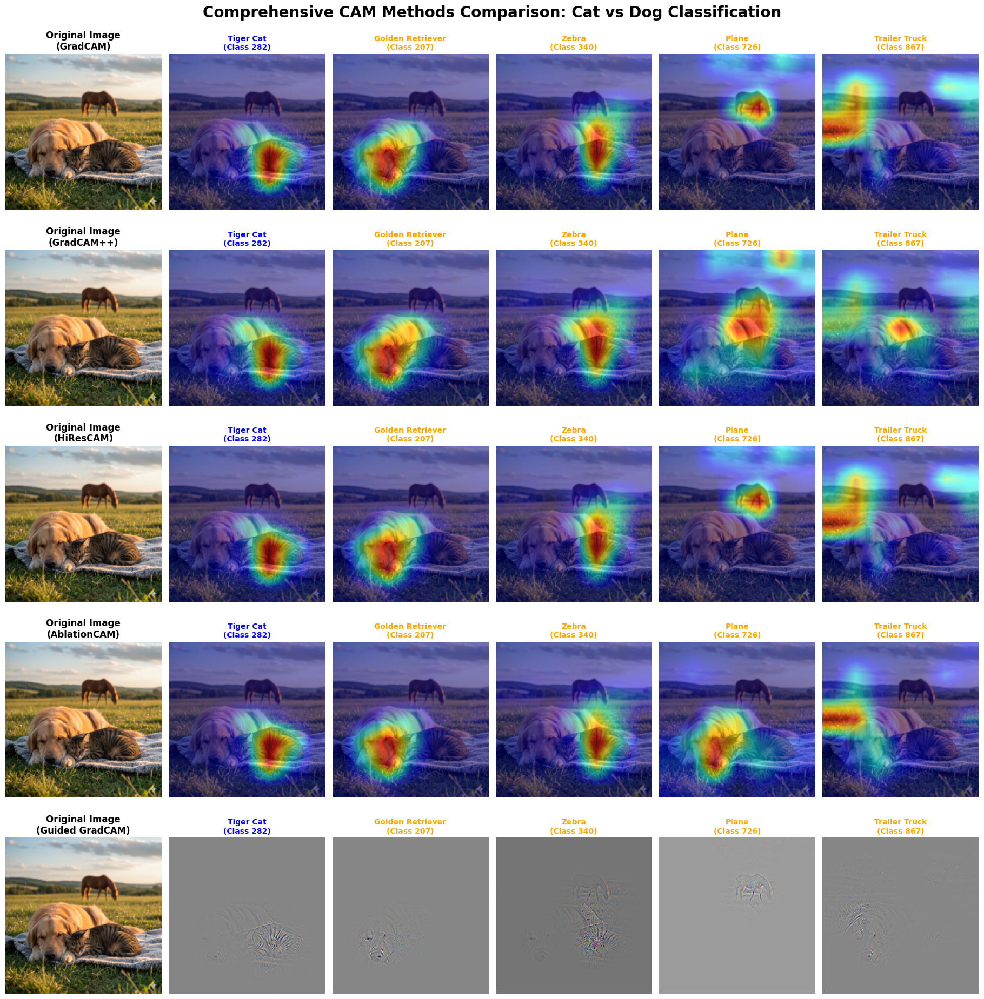

In [ ]:
# ==== Grid de ejes precreados y visualización ====
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F

# Background image: usa rgb_img si existe; si no, cae al tensor normalizado
try:
    bkg_img = rgb_img  # esperado en [0,1], (H,W,3)
except NameError:
    bkg_img = input_tensor.detach().cpu().squeeze(0).permute(1, 2, 0).numpy()
    # normaliza a [0,1] por si está normalizado Imagenet
    bkg_img = (bkg_img - bkg_img.min()) / (bkg_img.max() - bkg_img.min() + 1e-8)

# Crea todos los ejes de una
num_methods = len(method_class_visualizations)
num_classes = len(target_classes)
fig, axes = plt.subplots(nrows=num_methods, ncols=num_classes + 1, figsize=(20, 20))
if num_methods == 1:
    axes = np.expand_dims(axes, axis=0)  # garantiza 2D
axes = np.atleast_2d(axes)

# Título principal
fig.suptitle('Comprehensive CAM Methods Comparison: Cat vs Dog Classification',
             fontsize=20, fontweight='bold', y=0.98)

# Mapa: fila = método, col 0 = original, resto = clases
method_names = list(method_class_visualizations.keys())
class_names = list(next(iter(method_class_visualizations.values())).keys())

for row, method_name in enumerate(method_names):
    # Columna 0: imagen original
    ax0 = axes[row, 0]
    ax0.imshow(bkg_img)
    ax0.set_title(f'Original Image\n({method_name})', fontsize=12, fontweight='bold')
    ax0.axis('off')
    for side in ['top', 'bottom', 'left', 'right']:
        ax0.spines[side].set_visible(True)
        ax0.spines[side].set_linewidth(2)

    # Columnas 1..N: visualizaciones por clase
    for col, class_name in enumerate(class_names, start=1):
        ax = axes[row, col]
        vis = method_class_visualizations[method_name][class_name]
        ax.imshow(vis)
        title_color = 'blue' if 'Cat' in class_name else 'orange'
        ax.set_title(f'{class_name}\n(Class {target_classes[class_name]})',
                     fontsize=10, fontweight='bold', color=title_color)
        ax.axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.95, bottom=0.05, left=0.05, right=0.95)
plt.show()


### imagen diferentes modelos

In [25]:
import torch
from torchvision.models import resnet50, vgg16, vit_b_16, ResNet50_Weights, VGG16_Weights, ViT_B_16_Weights
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
from torchvision import transforms

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import requests
from io import BytesIO

# --- 1. Configuración ---


# Usar GPU si está disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

# Define la secuencia de transformaciones explícitamente
# 1. Redimensionar la imagen a 224x224
# 2. Convertirla a un Tensor de PyTorch
# 3. Normalizar los valores de los píxeles
data_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Diccionario para configurar los modelos
# Para cada modelo, definimos:
# - la función para cargarlo con pesos pre-entrenados
# - la capa objetivo para Grad-CAM
# - una función de transformación para los tensores (necesaria para ViT)
MODEL_CONFIG = {
    "ResNet50": {
        "model_loader": lambda: resnet50(weights=ResNet50_Weights.IMAGENET1K_V2),
        "target_layer_finder": lambda model: [model.layer4[-1]],
        "reshape_transform": None
    },
    "VGG16": {
        "model_loader": lambda: vgg16(weights=VGG16_Weights.IMAGENET1K_V1),
        "target_layer_finder": lambda model: [model.features[-1]],
        "reshape_transform": None
    },
    "ViT-B/16": {
        "model_loader": lambda: vit_b_16(weights=ViT_B_16_Weights.IMAGENET1K_V1),
        "target_layer_finder": lambda model: [model.encoder.layers[-1].ln_1],
        "reshape_transform": lambda tensor: tensor[:, 1:, :].reshape(tensor.size(0), 14, 14, tensor.size(2)).transpose(2, 3).transpose(1, 2)
    }
}

# # Dos imágenes de instancia (URLs)
IMAGE_URLS = [
    "https://raw.githubusercontent.com/incubodac/GradCamTP/main/imgs/perro_gato_caballo.png",
    "https://raw.githubusercontent.com/incubodac/GradCamTP/main/imgs/auto_bus.png",
    "https://raw.githubusercontent.com/incubodac/GradCamTP/main/imgs/avion_combate.png"
    ]

# # Tres clases objetivo de ImageNet (Nombre para mostrar: índice de clase)
# TARGET_CLASSES = {
#     "Gato Atigrado": 281,
#     "Golden Retriever": 207,
#     "Coche Deportivo": 817,
#     "Autobus":
# }
# Seleccionamos 4 para el ejemplo principal
SELECTED_CLASSES = {
    'Tiger Cat': 282,
    'Golden Retriever': 207,
    'Street Car': 817,
    'School Bus': 779,
    'War Plane': 895
}

# --- 2. Funciones de Ayuda ---
def load_and_preprocess_image(url):
    """
    Descarga una imagen, maneja la transparencia, la redimensiona a 224x224
    y la preprocesa para un modelo de PyTorch.
    """
    try:
        response = requests.get(url)
        response.raise_for_status()

        image_data = BytesIO(response.content)
        pil_img_raw = Image.open(image_data)

        # Manejo explícito de la transparencia para PNG
        if pil_img_raw.mode == 'RGBA' or 'transparency' in pil_img_raw.info:
            pil_img = Image.new("RGB", pil_img_raw.size, (255, 255, 255))
            pil_img.paste(pil_img_raw, mask=pil_img_raw.split()[3] if pil_img_raw.mode == 'RGBA' else None)
        else:
            pil_img = pil_img_raw.convert('RGB')

        # --- INICIO DE LA CORRECCIÓN ---
        # Aplicar la secuencia de transformaciones que definimos
        input_tensor = data_transform(pil_img)

        # Agregar una dimensión de "batch" (el modelo espera [B, C, H, W])
        input_tensor = input_tensor.unsqueeze(0)
        # --- FIN DE LA CORRECCIÓN ---

        return pil_img, input_tensor.to(device)

    except requests.exceptions.RequestException as e:
        print(f"Error descargando la imagen desde {url}: {e}")
        return None, None
    except Exception as e:
        print(f"Error procesando la imagen desde {url}: {e}")
        return None, None

def denormalize_image(tensor):
    """Revierte la normalización de un tensor para visualización."""
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    tensor = tensor.squeeze(0).cpu().numpy().transpose(1, 2, 0)
    tensor = std * tensor + mean
    tensor = np.clip(tensor, 0, 1)
    return tensor

Usando dispositivo: cuda



--- Procesando Modelo: ResNet50 ---
  Procesando Imagen 1...
  Procesando Imagen 2...
  Procesando Imagen 3...

--- Procesando Modelo: VGG16 ---
  Procesando Imagen 1...
  Procesando Imagen 2...
  Procesando Imagen 3...

--- Procesando Modelo: ViT-B/16 ---
  Procesando Imagen 1...
  Procesando Imagen 2...
  Procesando Imagen 3...


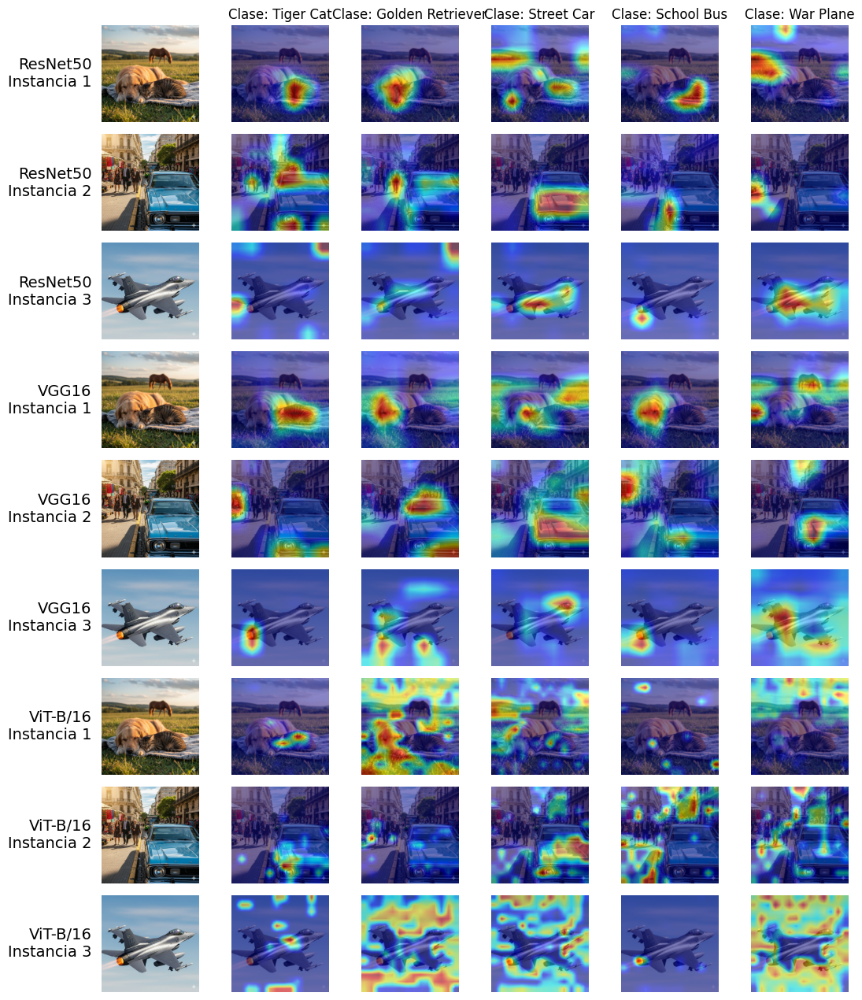

In [26]:
num_models = len(MODEL_CONFIG)
num_instances = len(IMAGE_URLS)
num_classes = len(SELECTED_CLASSES)

fig, axes = plt.subplots(num_models * num_instances, num_classes + 1, figsize=(12, 4 * num_models * 1.1))
# fig.suptitle("Comparación de Grad-CAM entre Modelos, Instancias y Clases", fontsize=20)

if axes.ndim == 1:
    axes = axes.reshape(1, -1)

current_row = 0

for model_name, config in MODEL_CONFIG.items():
    print(f"\n--- Procesando Modelo: {model_name} ---")
    model = config["model_loader"]().to(device).eval()
    target_layers = config["target_layer_finder"](model)
    cam = GradCAM(model=model, target_layers=target_layers, reshape_transform=config["reshape_transform"])

    for i, img_url in enumerate(IMAGE_URLS):
        print(f"  Procesando Imagen {i+1}...")
        pil_img, input_tensor = load_and_preprocess_image(img_url)

        if pil_img is None:
            current_row += 1
            continue

        ax_row_title = axes[current_row, 0]
        ax_row_title.imshow(pil_img)
        ax_row_title.axis('off')

        # Título de la fila a la izquierda
        label = f"{model_name}\nInstancia {i+1}"
        ax_row_title.text(-0.1, 0.5, label, transform=ax_row_title.transAxes,
                          fontsize=14, va='center', ha='right', rotation=0)

        for j, (class_name, class_id) in enumerate(SELECTED_CLASSES.items()):
            if current_row == 0:
                axes[0, j+1].set_title(f"Clase: {class_name}", size='large')

            ax_cam = axes[current_row, j+1]
            targets = [ClassifierOutputTarget(class_id)]

            grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            grayscale_cam = grayscale_cam[0, :]

            rgb_img_float = denormalize_image(input_tensor)
            visualization = show_cam_on_image(rgb_img_float, grayscale_cam, use_rgb=True)

            ax_cam.imshow(visualization)
            ax_cam.axis('off')

        current_row += 1

    del model, cam
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

plt.tight_layout(rect=[0.05, 0, 1, 0.97])
plt.show()


--- Procesando Modelo: ResNet50 ---
  Procesando Imagen 1...
  Procesando Imagen 2...
  Procesando Imagen 3...

--- Procesando Modelo: VGG16 ---
  Procesando Imagen 1...
  Procesando Imagen 2...
  Procesando Imagen 3...

--- Procesando Modelo: ViT-B/16 ---
  Procesando Imagen 1...
  Procesando Imagen 2...
  Procesando Imagen 3...


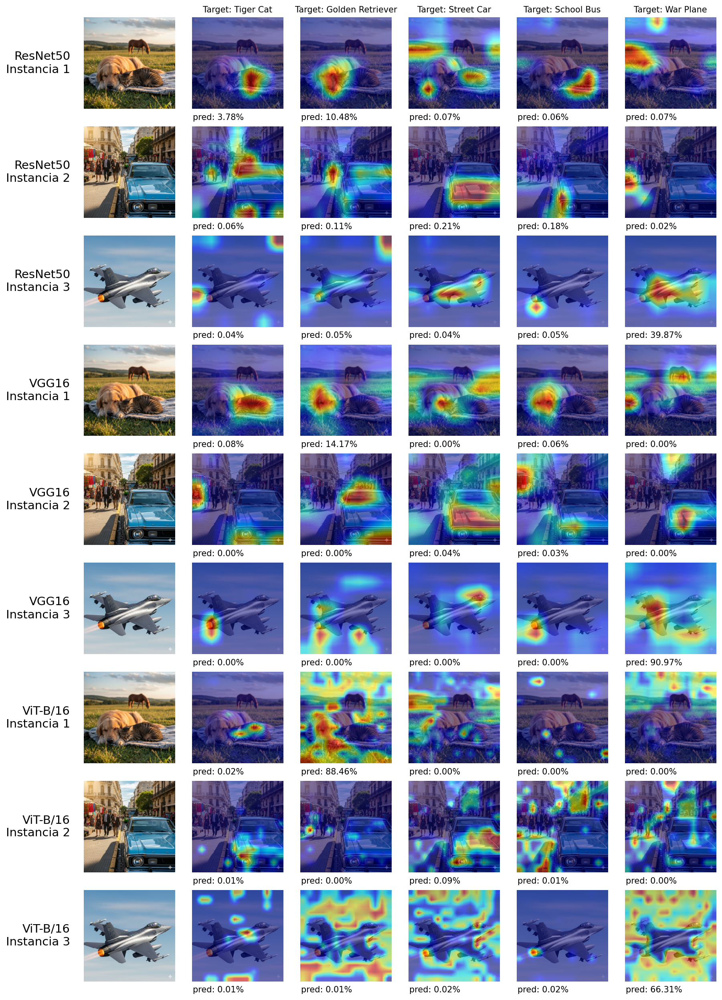

In [38]:
### visualizacion 2
# --- 3. Generación de Grad-CAM y Visualización ---

# Agregamos esta importación para la función softmax
import torch.nn.functional as F

num_models = len(MODEL_CONFIG)
num_instances = len(IMAGE_URLS)
num_classes = len(SELECTED_CLASSES)

fig, axes = plt.subplots(num_models * num_instances, num_classes + 1, figsize=(12, 5 * num_models * 1.1), layout='constrained', dpi=150)
# fig.suptitle("Comparación de Grad-CAM con Probabilidades por Clase", fontsize=20)

if axes.ndim == 1:
    axes = axes.reshape(1, -1)

current_row = 0

for model_name, config in MODEL_CONFIG.items():
    print(f"\n--- Procesando Modelo: {model_name} ---")
    model = config["model_loader"]().to(device).eval()
    target_layers = config["target_layer_finder"](model)
    cam = GradCAM(model=model, target_layers=target_layers, reshape_transform=config["reshape_transform"])

    for i, img_url in enumerate(IMAGE_URLS):
        print(f"  Procesando Imagen {i+1}...")
        pil_img, input_tensor = load_and_preprocess_image(img_url)

        if pil_img is None:
            current_row += 1
            continue

        # --- INICIO DE LA MODIFICACIÓN ---

        # 1. HACER UN FORWARD PASS PARA OBTENER LAS PREDICCIONES
        # Usamos torch.no_grad() para desactivar el cálculo de gradientes y acelerar la inferencia
        with torch.no_grad():
            outputs = model(input_tensor)
            # 2. APLICAR SOFTMAX PARA OBTENER PROBABILIDADES
            # La salida tiene forma [1, 1000], tomamos el primer elemento para tener un vector de probabilidades
            probabilities = F.softmax(outputs, dim=1)[0]

        # --- FIN DE LA MODIFICACIÓN ---

        # Mostrar imagen original y título de la fila
        ax_row_title = axes[current_row, 0]
        ax_row_title.imshow(pil_img)
        ax_row_title.axis('off')

        label = f"{model_name}\nInstancia {i+1}"
        ax_row_title.text(-0.15, 0.5, label, transform=ax_row_title.transAxes,
                          fontsize=14, va='center', ha='right', rotation=0)

        for j, (class_name, class_id) in enumerate(SELECTED_CLASSES.items()):

            # --- INICIO DE LA MODIFICACIÓN ---

            # 3. EXTRAER LA PROBABILIDAD PARA LA CLASE ACTUAL
            prob_percent = probabilities[class_id].item() * 100

            # --- FIN DE LA MODIFICACIÓN ---

            ax_cam = axes[current_row, j+1]

            # --- MODIFICACIÓN DEL TÍTULO ---
            # Ahora cada celda de CAM tendrá su propio título con la clase y su probabilidad
            if current_row == 0:
                ax_cam.set_title(f"Target: {class_name}", size='medium')
            # --- FIN DE LA MODIFICACIÓN ---
            ax_cam.text(0.01, -0.05, f"pred: {prob_percent:.2f}%", ha='left', va='top', transform=ax_cam.transAxes)

            targets = [ClassifierOutputTarget(class_id)]

            grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
            grayscale_cam = grayscale_cam[0, :]

            # Usamos la imagen original redimensionada para la visualización
            # La función `denormalize_image` no es necesaria aquí si usamos la `pil_img` procesada
            resized_pil_img = pil_img.resize((224, 224))
            rgb_img_float = np.array(resized_pil_img, dtype=np.float32) / 255
            visualization = show_cam_on_image(rgb_img_float, grayscale_cam, use_rgb=True)

            ax_cam.imshow(visualization)
            ax_cam.axis('off')

        current_row += 1

    del model, cam
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

# plt.tight_layout(rect=[0.1, 0, 1, 0.97]) # Ajustar margen izquierdo para el título de fila
plt.show()